# Homework 1 on the course "Contemporary Methods for Taking Decisions: Statistical Methods and Complex Network Analisys" 

### Andrey Byhckov

## Topic 1


### Task 1

Let's define a parameterized class of random variables given by density  $p_a(x) = c_a (1 + x)^{-a}$, $x > 0$

Using $\int p(x)dx = 1$ calculate normalization factor $c_a$.

In [1]:
using SymPy

@vars x positive=true
@vars a cₐ real=true
p = cₐ * (1  + x)^(-a)
p


          -a
cₐ*(x + 1)  

In [2]:
p_int = integrate(p, x)

   //       1 - a            \
   ||(x + 1)                 |
   ||------------  for a != 1|
cₐ*|<   1 - a                |
   ||                        |
   || log(x + 1)   otherwise |
   \\                        /

There're 3 branches:
* $a > 1$
* $a = 1$
* $a < 1$

#### Branch 1: $a > 1 \Rightarrow 1 - a < 0$

In [3]:
# b = 1 - a
@vars b negative=true

p_int_a_gr_1 = cₐ * (1 + x)^b / b
int_diff = subs(p_int_a_gr_1, x, oo) - subs(p_int_a_gr_1, x, 0)
Eq(subs(int_diff, b, 1 - a), 1)

 -cₐ     
----- = 1
1 - a    

$c_a = a - 1$, $a > 1$

#### Branch 2: $a < 1 \Rightarrow 1 - a > 0$ 

In [4]:
# b = 1 - a
@vars b positive=true

p_int_a_ls_1 = cₐ * (1 + x)^b / b
subs(p_int_a_ls_1, x, oo) - subs(p_int_a_ls_1, x, 0)

        cₐ
oo*cₐ - --
        b 

$\infty = 1$ is not solvable.

#### Branch 3: $a = 1$

In [5]:
p_int_a_eq_1 = cₐ * log(x + 1)
int_diff = subs(p_int_a_eq_1, x, oo) - subs(p_int_a_eq_1, x, 0)
Eq(int_diff, 1)

oo*cₐ = 1

### Result: integral is finite when $a > 1$ and normalizing factor $c_a = a - 1$ is positive.  

In [6]:
# b = a - 1
@vars b positive=true real=true
p = b * (x + 1)^(-b - 1)


         -b - 1
b*(x + 1)      

In [7]:
E = simplify(integrate(p * x, (x, 0, oo)))

/           1                       
|         -----            for b > 1
|         b - 1                     
|                                   
|   oo                              
|    /                              
<   |                               
|   |           -b - 1              
|b* |  x*(x + 1)       dx  otherwise
|   |                               
|  /                                
|  0                                
\                                   

As we see, this integral does not converge when $b \le 1$. Indeed, in asymptotic form we deal with integral in form $\int_0^{\infty}\frac{1}{x^b}$. It does not converge when $b \le 1$

In [8]:
E = E.args[1].args[1]

  1  
-----
b - 1

In [9]:
Var = simplify(integrate(x^2 * p, (x, 0, oo)) - E^2)

/               b                           
|        ----------------          for b > 2
|                       2                   
|        (b - 2)*(b - 1)                    
|                                           
|   oo                                      
|    /                                      
<   |                                       
|   |   2        -b                         
|   |  x *(x + 1)           1               
|b* |  ------------ dx - --------  otherwise
|   |     x + 1                 2           
|   |                    (b - 1)            
|  /                                        
\  0                                        

Same logic here.

In [10]:
Var = simplify(integrate(x^2 * p, (x, 0, oo)) - E^2).args[1].args[1]

       b        
----------------
               2
(b - 2)*(b - 1) 

In [11]:
bs = collect(1.1:0.1:10)
as = bs .+ 1
es = map(E, bs)
vs = map(Var, bs);

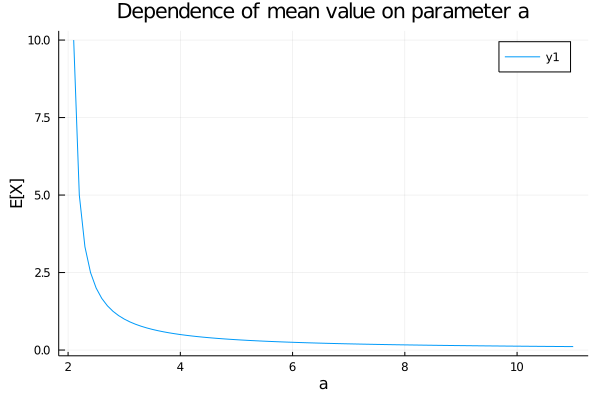

In [12]:
using Plots

plot(as, es)
xlabel!("a")
ylabel!("E[X]")
title!("Dependence of mean value on parameter a")

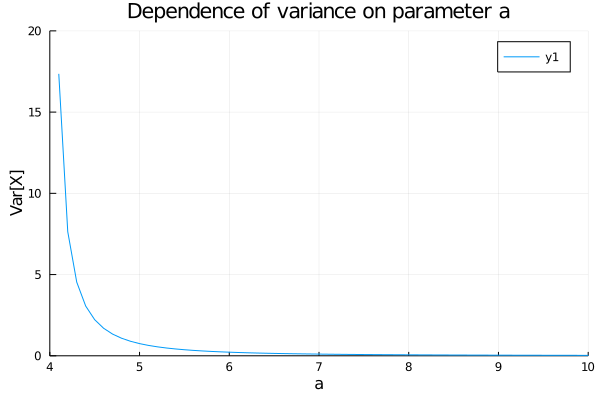

In [13]:
plot(as .+ 1, vs)
xlabel!("a")
ylabel!("Var[X]")
title!("Dependence of variance on parameter a")
xlims!((4, 10))
ylims!((0, 20))

### Task 2

Here we define our distribution explicitly.

In [14]:
using Distributions
import Distributions.insupport
import Base.minimum, Base.maximum

struct MyDist <: ContinuousUnivariateDistribution
    a::Float64
end

pdf(d::MyDist, x::Float64) = (d.a - 1) * (x + 1)^(-d.a)
logpdf(d::MyDist, x::Float64) = log(d.a - 1) + (-d.a) * log(x + 1)
cdf(d::MyDist, x::Float64) = 1 - (x + 1)^(1 - d.a)
quantile(d::MyDist, q::Real) = (1 - q)^(1 / (1 - d.a)) - 1 # inverse cdf
mean(d::MyDist) = 1 / (d.a - 2)
var(d::MyDist) = (d.a - 1) / ((d.a - 2) * (d.a - 3)^2)
minimum(d::MyDist) = 0
maximum(d::MyDist) = Inf
insupport(d::MyDist, x::Real) = x > 0

insupport (generic function with 31 methods)

In [15]:
function gen_samples(dist::MyDist)
    sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
end

function plot_pdf(a::Real)
    xs = 0.01:0.05:10
    dist = MyDist(a)
    plot(xs, map(x -> pdf(dist, x), xs), fill=(0, .5,:orange))
end

function plot_log_pdf(a::Real)
    xs = 0.01:0.05:10
    dist = MyDist(a)
    plot(xs, map(x -> pdf(dist, x), xs), fill=(0, .5,:orange), xaxis=:log)
end

function plot_cdf(a::Real)
    xs = 0.01:0.05:5
    dist = MyDist(a)
    plot(xs, map(x -> cdf(dist, x), xs), fill=(0, .5,:orange))
end

function plot_log_cdf(a::Real)
    xs = 0.01:0.05:10
    dist = MyDist(a)
    plot(xs, map(x -> cdf(dist, x), xs), fill=(0, .5,:orange),xaxis=:log)
end

# We restrict number of samples to ignore small tail with extremely large values 
function plot_hist(a::Real, upper_bound=900000)
    dist = MyDist(a)
    samples = gen_samples(dist)
    histogram(samples[1:upper_bound])
end

function plot_log_hist(a::Real, upper_bound=900000)
    dist = MyDist(a)
    samples = gen_samples(dist)
    histogram(samples[1:upper_bound], yaxis=:log)
end

plot_log_hist (generic function with 2 methods)

### Task 3

### $a = 1.5$

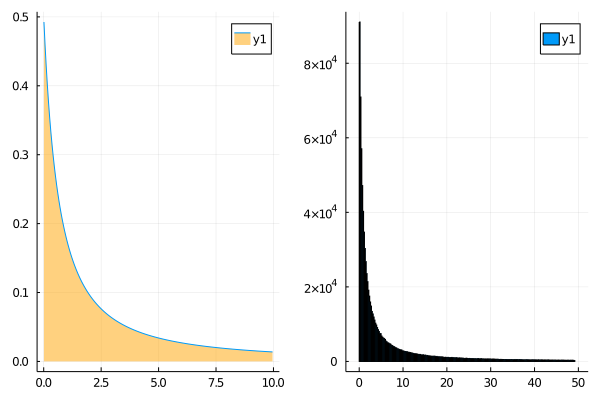

In [16]:
l = @layout [a b]
p1 = plot_pdf(1.5)
p2 = plot_hist(1.5)
plot(p1, p2, layout=l)

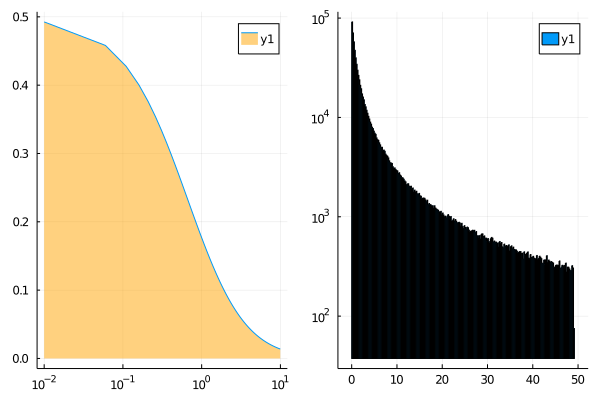

In [17]:
l = @layout [a b]
p1 = plot_log_pdf(1.5)
p2 = plot_log_hist(1.5)
plot(p1, p2, layout=l)

### $a = 2$

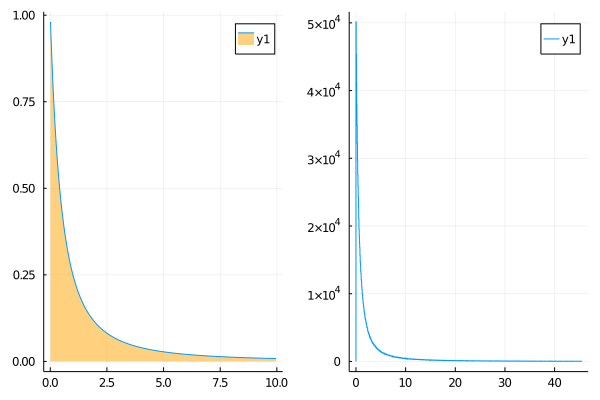

In [18]:
l = @layout [a b]
p1 = plot_pdf(2.0)
p2 = plot_hist(2.0, 1026000)
plot(p1, p2, layout=l)

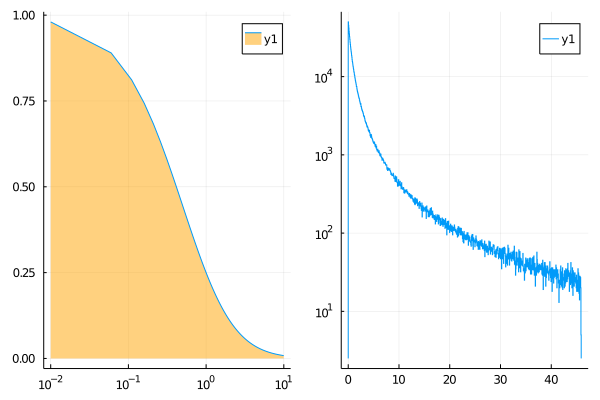

In [19]:
l = @layout [a b]
p1 = plot_log_pdf(2.0)
p2 = plot_log_hist(2.0, 1026000)
plot(p1, p2, layout=l)

### $a = 2.5$

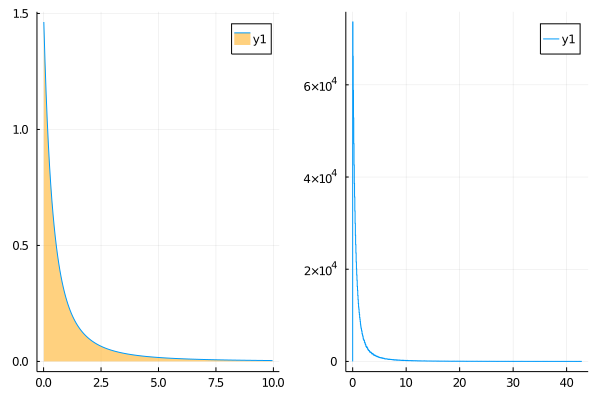

In [20]:
l = @layout [a b]
p1 = plot_pdf(2.5)
p2 = plot_hist(2.5, 1045000)
plot(p1, p2, layout=l)

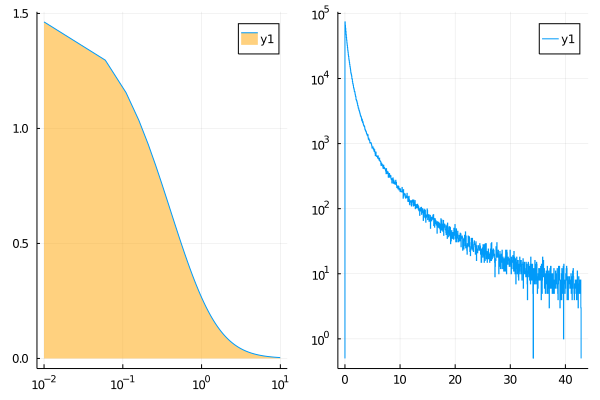

In [21]:
l = @layout [a b]
p1 = plot_log_pdf(2.5)
p2 = plot_log_hist(2.5, 1045000)
plot(p1, p2, layout=l)

### $a = 4$

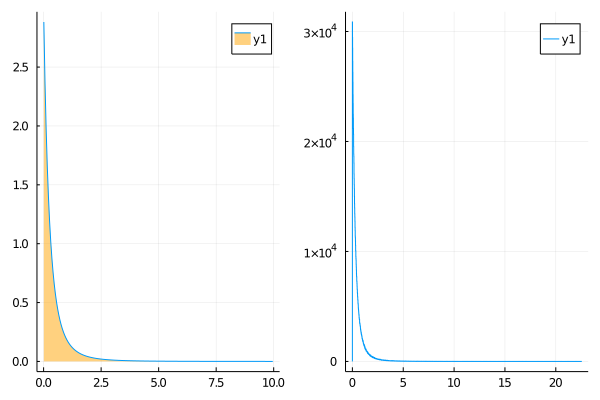

In [22]:
l = @layout [a b]
p1 = plot_pdf(4.0)
p2 = plot_hist(4.0, 1048500)
plot(p1, p2, layout=l)

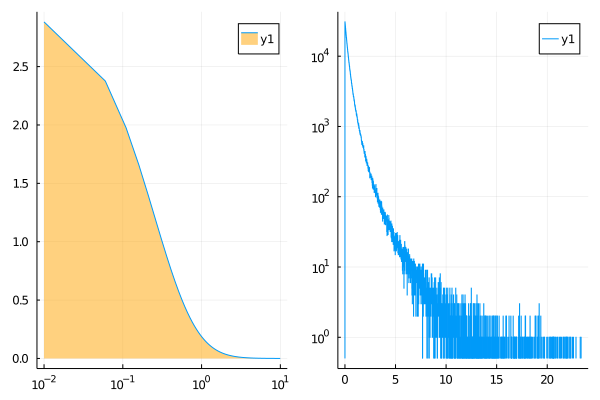

In [23]:
l = @layout [a b]
p1 = plot_log_pdf(4.0)
p2 = plot_log_hist(4.0, 1048500)
plot(p1, p2, layout=l)

### $a = 10$

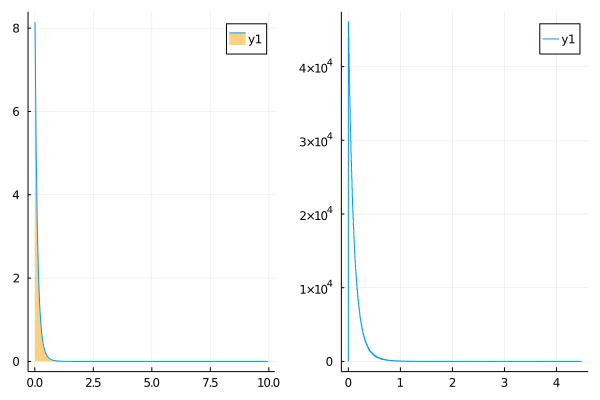

In [24]:
l = @layout [a b]
p1 = plot_pdf(10.0)
p2 = plot_hist(10.0, 2^20)
plot(p1, p2, layout=l)

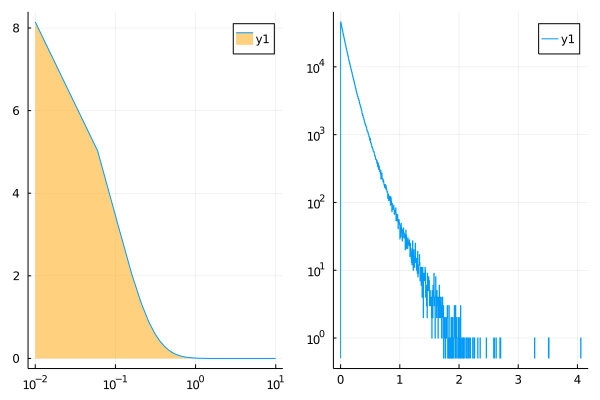

In [25]:
l = @layout [a b]
p1 = plot_log_pdf(10.0)
p2 = plot_log_hist(10.0, 2^20)
plot(p1, p2, layout=l)

### PDF dynamics

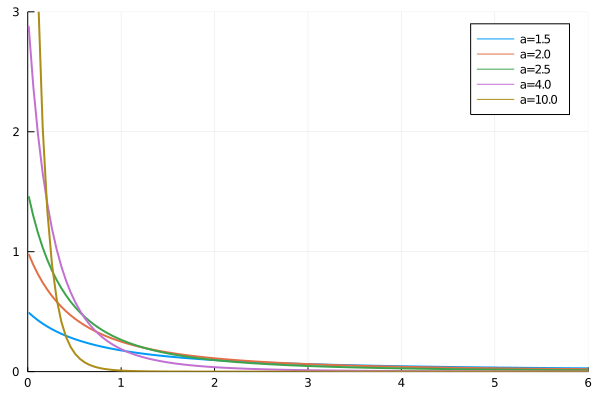

In [26]:
xs = 0.01:0.05:10
plot()
for a in [1.5, 2.0, 2.5, 4, 10]
    dist = MyDist(a)
    plot!(xs, map(x -> pdf(dist, x), xs), label="a=$a", w=2)
end
ylims!((0, 3))
xlims!((0, 6))

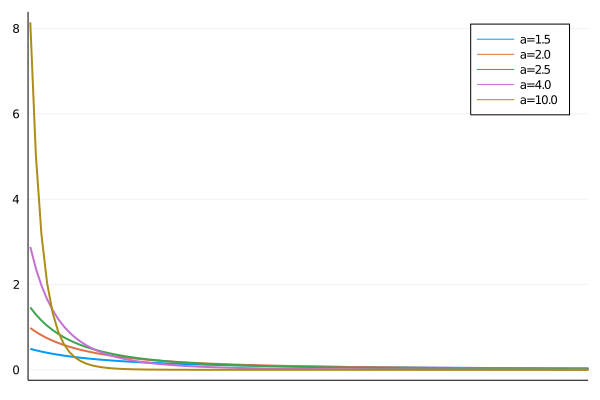

┌ Warning: No strict ticks found
└ @ PlotUtils D:\Julia\packages\packages\PlotUtils\3Ttrk\src\ticks.jl:283
┌ Warning: No strict ticks found
└ @ PlotUtils D:\Julia\packages\packages\PlotUtils\3Ttrk\src\ticks.jl:283


In [27]:
xs = 0.01:0.05:10
plot()
for a in [1.5, 2.0, 2.5, 4.0, 10.0]
    dist = MyDist(a)
    plot!(xs, map(x -> pdf(dist, x), xs), label="a=$a", w=2, xaxis=:log)
end
xlims!((-0.01, 5))


### Histogram dynamics

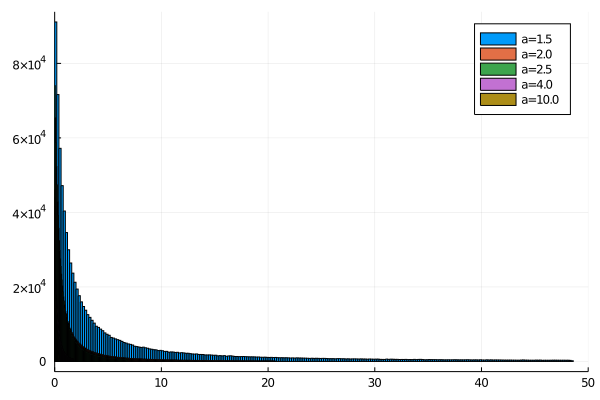

In [28]:
dist = MyDist(1.5)
samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
histogram(samples[1:900000], label="a=1.5")
for a in [2.0, 2.5, 4.0, 10.0]
    dist = MyDist(a)
    samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
    histogram!(samples[1:1000000], label="a=$a")
end
xlims!(0, 50)

In [29]:
using StatsPlots

dist = MyDist(1.5)
samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
p1 = histogram(samples[1:900000], label="a=1.5", yaxis=:log, fillalpha=0.2)
for a in [2.0, 2.5, 4.0, 10.0]
    dist = MyDist(a)
    samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
    histogram!(samples[1:1000000], label="a=$a", yaxis=:log, fillalpha=0.2)
end
xlims!((0, 50))

dist = MyDist(1.5)
samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
p2 = histogram(samples[1:900000], label="a=1.5", yaxis=:log)
for a in [2.0, 2.5, 4.0, 10.0]
    dist = MyDist(a)
    samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
    histogram!(samples[1:1000000], label="a=$a", yaxis=:log)
end
xlims!((0, 25))

dist = MyDist(1.5)
samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
p3 = histogram(samples[1:900000], label="a=1.5", yaxis=:log)
for a in [2.0, 2.5, 4.0, 10.0]
    dist = MyDist(a)
    samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
    histogram!(samples[1:1000000], label="a=$a", yaxis=:log)
end
xlims!((0, 10))

dist = MyDist(1.5)
samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
p4 = histogram(samples[1:900000], label="a=1.5", yaxis=:log)
for a in [2.0, 2.5, 4.0, 10.0]
    dist = MyDist(a)
    samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
    histogram!(samples[1:1000000], label="a=$a", yaxis=:log)
end
xlims!((0, 5))

dist = MyDist(1.5)
samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
p5 = histogram(samples[1:900000], label="a=1.5", yaxis=:log)
for a in [2.0, 2.5, 4.0, 10.0]
    dist = MyDist(a)
    samples = sort(map(y -> quantile(dist, y), rand(Uniform(0, 1), 2^20)))
    histogram!(samples[1:1000000], label="a=$a", yaxis=:log)
end
xlims!((0, 1))

plot(p1, p2, p3, p4, p5, layout=@layout [a1 a2 ; a3 a4; a5])

Based on the obtained graphs, we can confirm that the higher the value of the parameter $a$, the lower the spread of the random variable.

### Task 4

#### $a = 1.5$

In [30]:
import Statistics

Ns = map(i -> 2^i, 1:20)
dist = MyDist(1.5)
samples = gen_samples(dist);

In [31]:
Es = map(N -> Statistics.mean(samples[1:N]), Ns)
Vars = map(N -> Statistics.var(samples[1:N]), Ns);

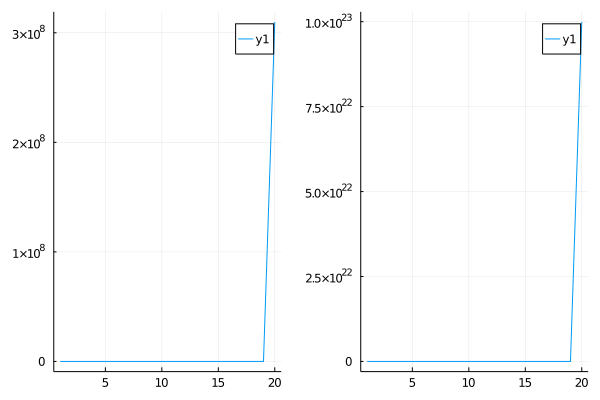

In [32]:
xs = 1:20
p1 = plot(xs, Es)
p2 = plot(xs, Vars)
plot(p1, p2)

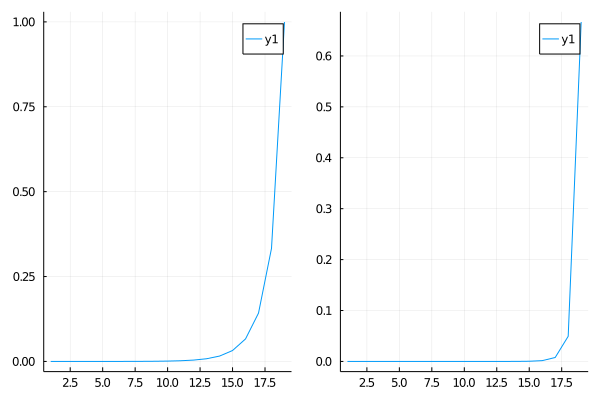

In [33]:
xs = 1:19
p1 = plot(xs, Es[1:19])
p2 = plot(xs, Vars[1:19])
plot(p1, p2)

We observe the exponential grownth when x is large enough.

#### $a = 2$

In [34]:
Ns = map(i -> 2^i, 1:20)
dist = MyDist(2)
samples = gen_samples(dist);

In [35]:
Es = map(N -> Statistics.mean(samples[1:N]), Ns)
Vars = map(N -> Statistics.var(samples[1:N]), Ns);

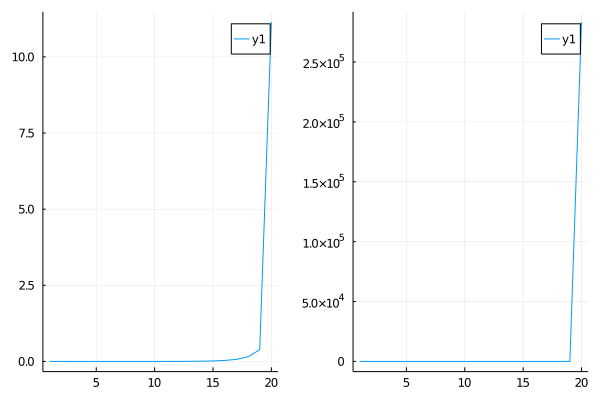

In [36]:
xs = 1:20
p1 = plot(xs, Es)
p2 = plot(xs, Vars)
plot(p1, p2)

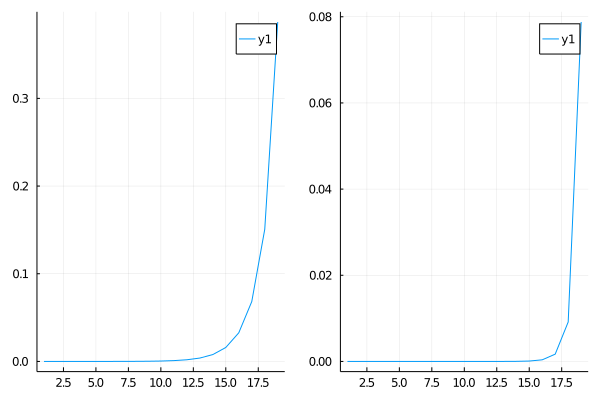

In [37]:
xs = 1:19
p1 = plot(xs, Es[1:19])
p2 = plot(xs, Vars[1:19])
plot(p1, p2)

#### $a = 2.5$

In [38]:
Ns = map(i -> 2^i, 1:20)
dist = MyDist(2.5)
samples = gen_samples(dist);

In [39]:
Es = map(N -> Statistics.mean(samples[1:N]), Ns)
Vars = map(N -> Statistics.var(samples[1:N]), Ns);

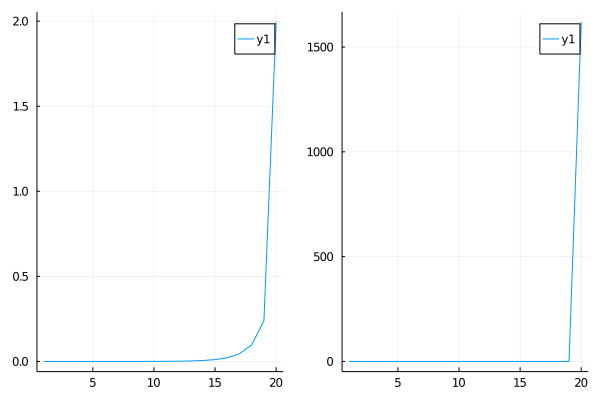

In [40]:
xs = 1:20
p1 = plot(xs, Es)
p2 = plot(xs, Vars)
plot(p1, p2)

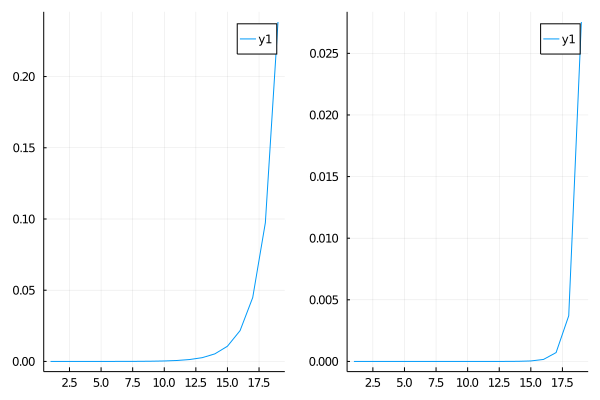

In [41]:
xs = 1:19
p1 = plot(xs, Es[1:19])
p2 = plot(xs, Vars[1:19])
plot(p1, p2)

#### $a = 4$

In [42]:
Ns = map(i -> 2^i, 1:20)
dist = MyDist(4)
samples = gen_samples(dist);

In [43]:
Es = map(N -> Statistics.mean(samples[1:N]), Ns)
Vars = map(N -> Statistics.var(samples[1:N]), Ns);

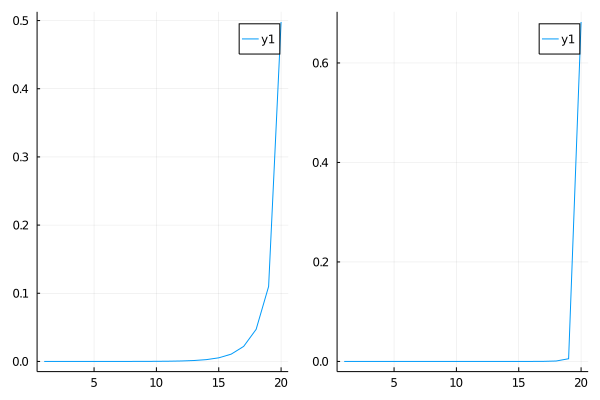

In [44]:
xs = 1:20
p1 = plot(xs, Es)
p2 = plot(xs, Vars)
plot(p1, p2)

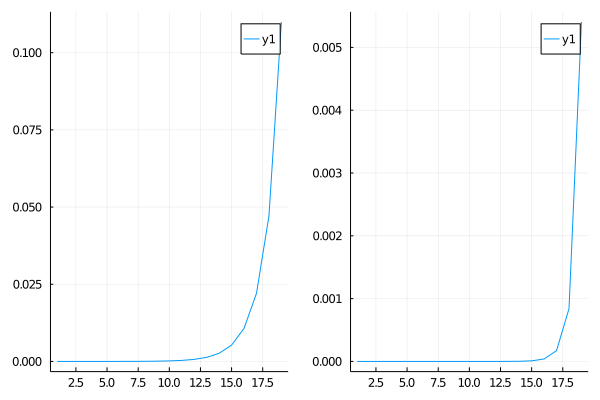

In [45]:
xs = 1:19
p1 = plot(xs, Es[1:19])
p2 = plot(xs, Vars[1:19])
plot(p1, p2)

#### $a = 10$

In [46]:
Ns = map(i -> 2^i, 1:20)
dist = MyDist(10)
samples = gen_samples(dist);

In [47]:
Es = map(N -> Statistics.mean(samples[1:N]), Ns)
Vars = map(N -> Statistics.var(samples[1:N]), Ns);

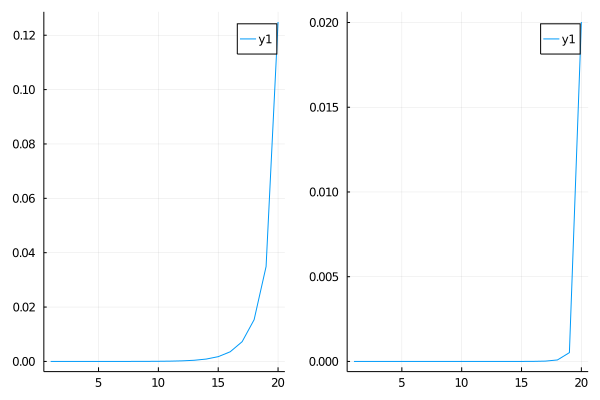

In [48]:
xs = 1:20
p1 = plot(xs, Es)
p2 = plot(xs, Vars)
plot(p1, p2)

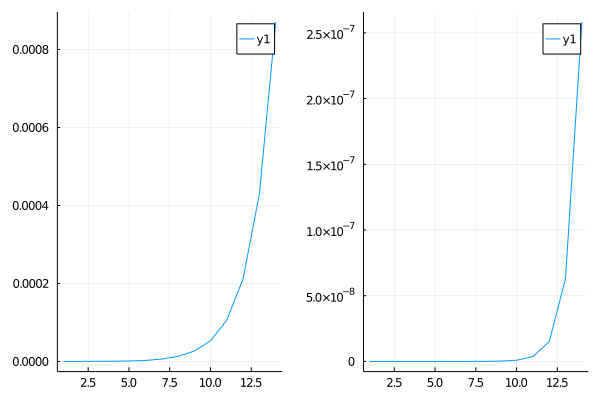

In [49]:
xs = 1:14
p1 = plot(xs, Es[1:14])
p2 = plot(xs, Vars[1:14])
plot(p1, p2)

On every graph from this task we can see same picture - exponential growth. It happens because the right tail of our distribution, despite its small number, has significantly large values that affect the descriptive statistics.

### Task 5

#### Split by 16

In [50]:
import Base.Iterators

#### $a = 1.5$

In [51]:
dist = MyDist(1.5)
samples = gen_samples(dist);
samples_part_16 = Base.Iterators.partition(samples, 16) |> collect;
samples_part_256 = Base.Iterators.partition(samples, 256) |> collect;

In [52]:
Es_16 = map(part -> Statistics.mean(part), samples_part_16)
Vars_16 = map(part -> Statistics.var(part), samples_part_16);
Es_256 = map(part -> Statistics.mean(part), samples_part_256)
Vars_256 = map(part -> Statistics.var(part), samples_part_256);

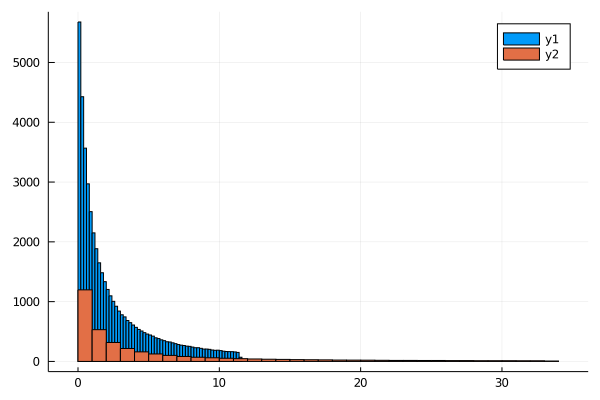

In [53]:
p1 = histogram(Es_16[1:47000])
histogram!(Es_256[1:3400])


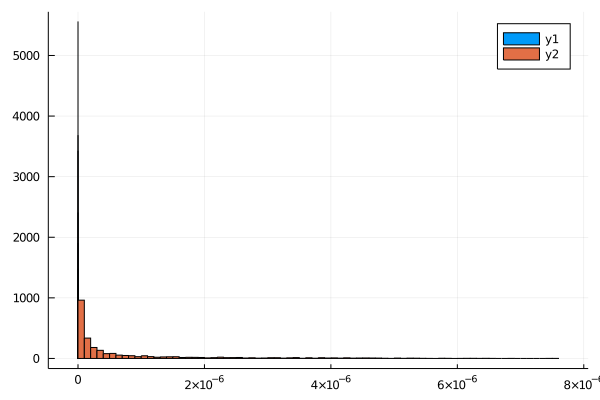

In [54]:
p2 = histogram(Vars_16[1:35000])
histogram!(Vars_256[1:2500])

#### $a = 2$

In [55]:
dist = MyDist(2)
samples = gen_samples(dist);
samples_part_16 = Base.Iterators.partition(samples, 16) |> collect;
samples_part_256 = Base.Iterators.partition(samples, 256) |> collect;

In [56]:
Es_16 = map(part -> Statistics.mean(part), samples_part_16)
Vars_16 = map(part -> Statistics.var(part), samples_part_16);
Es_256 = map(part -> Statistics.mean(part), samples_part_256)
Vars_256 = map(part -> Statistics.var(part), samples_part_256);

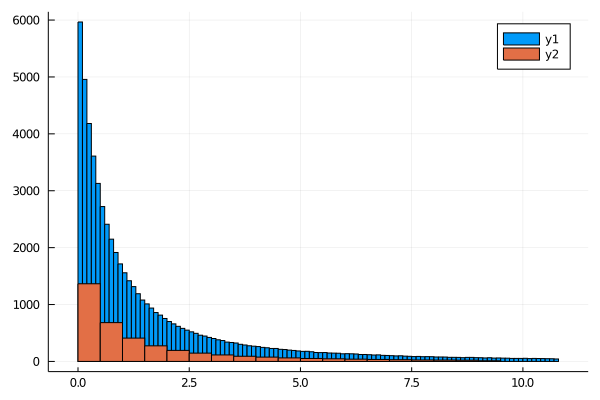

In [57]:
p1 = histogram(Es_16[1:60000])
histogram!(Es_256[1:3700])


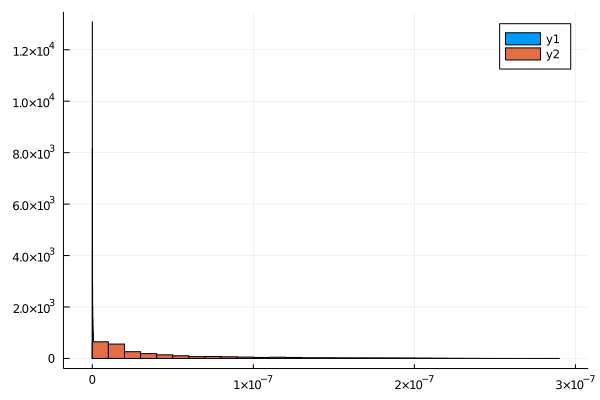

In [58]:
p2 = histogram(Vars_16[1:47000])
histogram!(Vars_256[1:2500])

#### $a = 2.5$

In [59]:
dist = MyDist(2.5)
samples = gen_samples(dist);
samples_part_16 = Base.Iterators.partition(samples, 16) |> collect;
samples_part_256 = Base.Iterators.partition(samples, 256) |> collect;

In [60]:
Es_16 = map(part -> Statistics.mean(part), samples_part_16)
Vars_16 = map(part -> Statistics.var(part), samples_part_16);
Es_256 = map(part -> Statistics.mean(part), samples_part_256)
Vars_256 = map(part -> Statistics.var(part), samples_part_256);

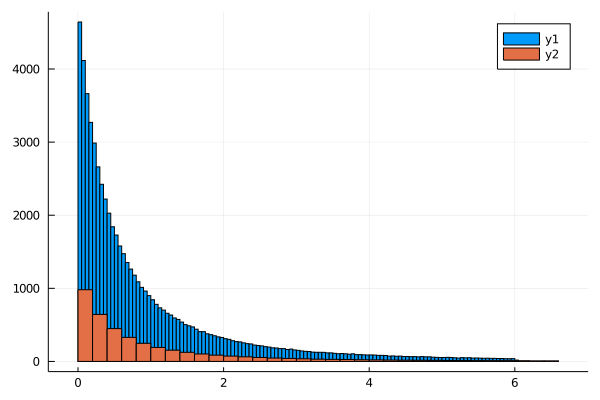

In [61]:
p1 = histogram(Es_16[1:62000])
histogram!(Es_256[1:3900])


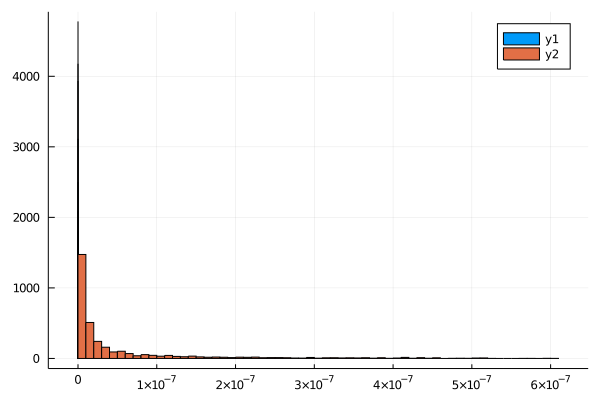

In [62]:
p2 = histogram(Vars_16[1:40000])
histogram!(Vars_256[1:3300])

#### $a = 4$

In [63]:
dist = MyDist(4)
samples = gen_samples(dist);
samples_part_16 = Base.Iterators.partition(samples, 16) |> collect;
samples_part_256 = Base.Iterators.partition(samples, 256) |> collect;

In [64]:
Es_16 = map(part -> Statistics.mean(part), samples_part_16)
Vars_16 = map(part -> Statistics.var(part), samples_part_16);
Es_256 = map(part -> Statistics.mean(part), samples_part_256)
Vars_256 = map(part -> Statistics.var(part), samples_part_256);

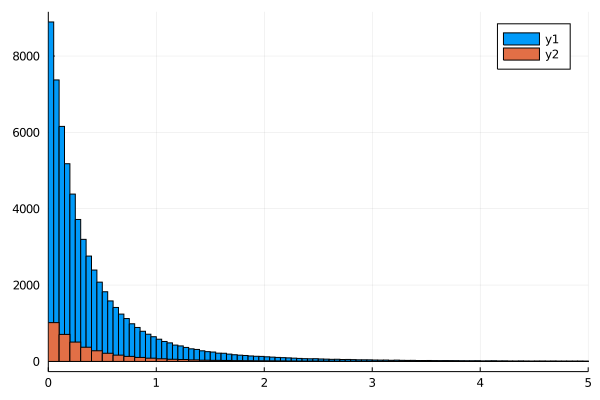

In [65]:
p1 = histogram(Es_16[1:end])
histogram!(Es_256[1:end])
xlims!((0, 5))

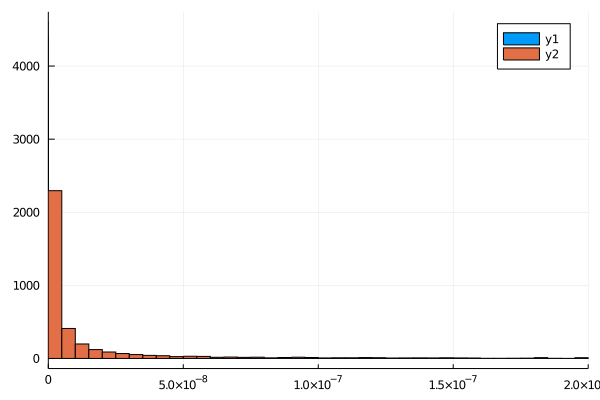

In [66]:
p2 = histogram(Vars_16[1:50000])
histogram!(Vars_256[1:4000])
xlims!((0, 2e-7))

#### $a = 10$

In [67]:
dist = MyDist(10)
samples = gen_samples(dist);
samples_part_16 = Base.Iterators.partition(samples, 16) |> collect;
samples_part_256 = Base.Iterators.partition(samples, 256) |> collect;

In [68]:
Es_16 = map(part -> Statistics.mean(part), samples_part_16)
Vars_16 = map(part -> Statistics.var(part), samples_part_16);
Es_256 = map(part -> Statistics.mean(part), samples_part_256)
Vars_256 = map(part -> Statistics.var(part), samples_part_256);

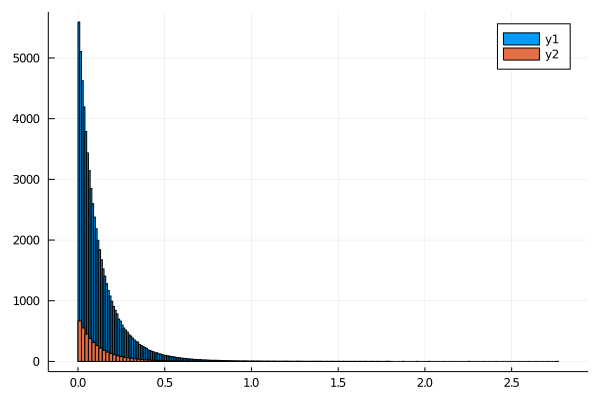

In [69]:
p1 = histogram(Es_16[1:end])
histogram!(Es_256[1:end])

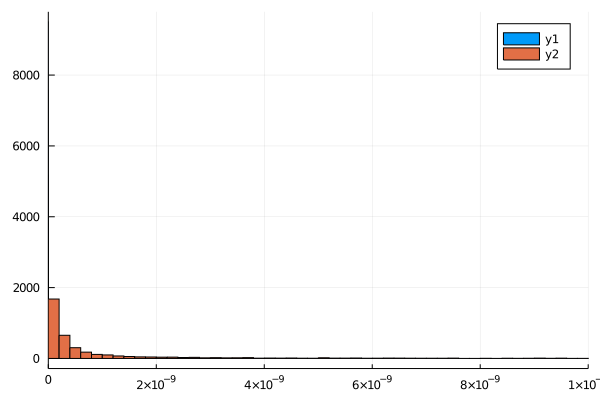

In [70]:
p2 = histogram(Vars_16[1:60000])
histogram!(Vars_256[1:4000])
xlims!((0, 1e-8))

The resulting graphs keep the expected trend - the higher $a$, the closer to 0 are the values of the random variable. Also, so that the heavy tails did not interfere with the output of histograms, we had to cut them off.

This distribution is indeed similar to the right side of the normal distribution, but I would highlight the following significant differences:
1. The tail of the normal distribution does not affect its descriptive statistics so much
2. Our distribution is asymmetrical: it can be approximated well with only half of the symmetrical distribution.

## Topic2

### Task 1

In [71]:
dist = Uniform(0, 1000)
samples = rand(dist, 10^6) |> collect |> sort;
samples_diff = zip(samples[1:end-1], samples[2:end]) |> collect .|> x -> x[2] - x[1];

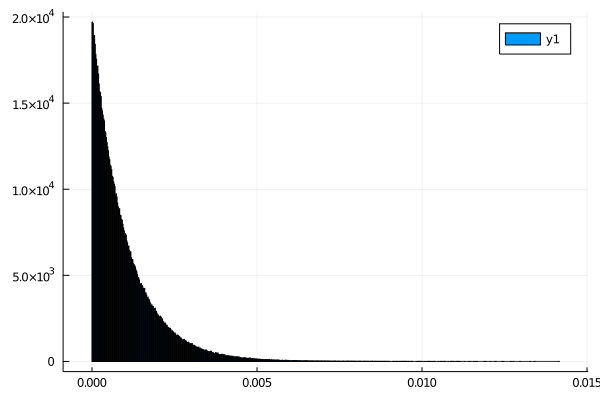

In [72]:
histogram(samples_diff)

Our difference distribution well described with the family of Exponential random variables.

In [73]:
exp_dist = fit(Exponential, samples_diff)

Exponential{Float64}(θ=0.0010000006179426597)

In [74]:
Statistics.mean(samples_diff)

0.0010000006179426597

In [75]:
import Distributions
Statistics.mean(samples_diff) ≈ Distributions.mean(exp_dist)

true

In [76]:
Statistics.var(samples_diff)

9.995182150646928e-7

In [77]:
Statistics.var(samples_diff) ≈ Distributions.var(exp_dist)

false

In [78]:
isapprox(Statistics.var(samples_diff), Distributions.var(exp_dist), atol=1e-8)

true

### Task 2

#### len = 1

In [79]:
intervals_1 = zip(0:2:1000, 1:2:1000) |> collect
interval_counts_1 = intervals_1 .|> intr -> count(x -> intr[1] ≤ x < intr[2], samples);

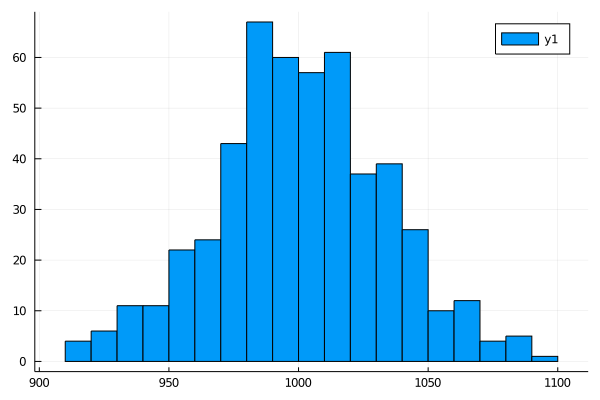

In [80]:
histogram(interval_counts_1)

In [81]:
mean_1 = Statistics.mean(interval_counts_1)

1000.302

In [82]:
var_1 = Statistics.var(interval_counts_1)

1096.2673306613228

In [83]:
fit(Poisson, interval_counts_1)

Poisson{Float64}(λ=1000.302)

#### len = 0.1

In [84]:
intervals_01 = zip(0:0.2:1000, 0.1:0.2:1000) |> collect
interval_counts_01 = intervals_01 .|> intr -> count(x -> intr[1] ≤ x < intr[2], samples);

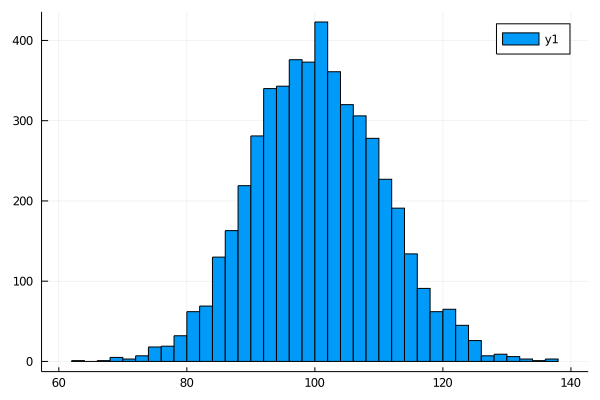

In [85]:
histogram(interval_counts_01)

In [86]:
mean_01 = Statistics.mean(interval_counts_01)

99.9786

In [87]:
var_01 = Statistics.var(interval_counts_01)

101.81330470094018

In [88]:
fit(Poisson, interval_counts_01)

Poisson{Float64}(λ=99.9786)

#### len = 0.01

In [89]:
intervals_001 = zip(0:0.02:1000, 0.01:0.02:1000) |> collect
interval_counts_001 = intervals_001 .|> intr -> count(x -> intr[1] ≤ x < intr[2], samples);

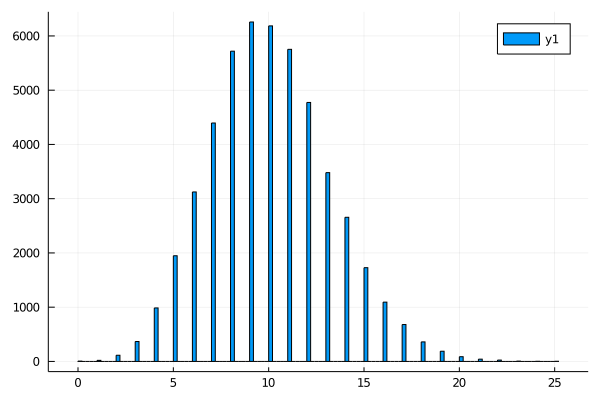

In [90]:
histogram(interval_counts_001)

In [91]:
mean_001 = Statistics.mean(interval_counts_001)

9.99886

In [92]:
var_001 = Statistics.var(interval_counts_001)

10.057059841596828

In [93]:
fit(Poisson, interval_counts_001)

Poisson{Float64}(λ=9.99886)

We can confirm that regardless of the choice of the interval length, the distribution is ideally modeled every time by the Poisson distribution.